In [3]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import warnings

warnings.filterwarnings("ignore")

C:\Users\fedi1\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\fedi1\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
C:\Users\fedi1\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [14]:
url = "quantity_sums.csv"

data = pd.read_csv(url)

In [17]:
import pandas as pd

# Find unique CUSTOMER_NUMBER values and sort them
unique_customers = sorted(data['CUSTOMER_NUMBER'].unique())

# Create a dictionary to store data for each customer
customer_data = {}

# Create a dictionary to store xts data for each customer
xts_data = {}

# Iterate over unique customer numbers
for customer_number in unique_customers:
    # Subset the data for the current customer number
    customer_subset = data[data['CUSTOMER_NUMBER'] == customer_number].drop(columns=['CUSTOMER_NUMBER'])
    # Store the subset data in the dictionary with customer number as key
    customer_data[customer_number] = customer_subset

    # Print unique TERMINAL_PRODUCT_NUMBER for the current customer
    unique_terminal_product_numbers = sorted(customer_subset['TERMINAL_PRODUCT_NUMBER'].unique())
    print(f"Customer {customer_number}: {unique_terminal_product_numbers}")

    # Create variables dynamically for each product number for the current customer
    for product_number in unique_terminal_product_numbers:
        # Construct variable name
        variable_name = f"data_customer_{customer_number}_product_number_{product_number}"
        # Filter data for the current product number
        filtered_data = customer_subset[customer_subset['TERMINAL_PRODUCT_NUMBER'] == product_number].drop(columns=['TERMINAL_PRODUCT_NUMBER'])
        # Assign the filtered data to the dynamically created variable
        globals()[variable_name] = filtered_data

        # Convert FOLIO_NUMBER to datetime format if the column exists
        folio_number_column = f"FOLIO_NUMBER"
        if folio_number_column in filtered_data.columns:
            filtered_data[folio_number_column] = pd.to_datetime(filtered_data[folio_number_column], format='%Y%m%d')

        # Create xts dynamically for each product number
        xts_variable_name = f"xts_data_customer_{customer_number}_product_number_{product_number}"
        xts_data[xts_variable_name] = pd.Series(filtered_data['ORDERED_QUANTITY'].values, index=filtered_data[folio_number_column])

Customer 1: [4, 7]
Customer 2: [4, 7]
Customer 3: [4, 7, 8, 9, 10, 11]
Customer 5: [4, 7, 10, 12, 13]
Customer 6: [4, 7]
Customer 7: [4, 7]
Customer 8: [4, 7, 10, 11]
Customer 9: [4, 7]
Customer 12: [4, 7]
Customer 13: [4, 7]
Customer 14: [4, 7]
Customer 15: [4, 7]
Customer 16: [4, 7]
Customer 17: [4, 7]
Customer 18: [4, 7]
Customer 19: [4, 7]
Customer 20: [4, 7]


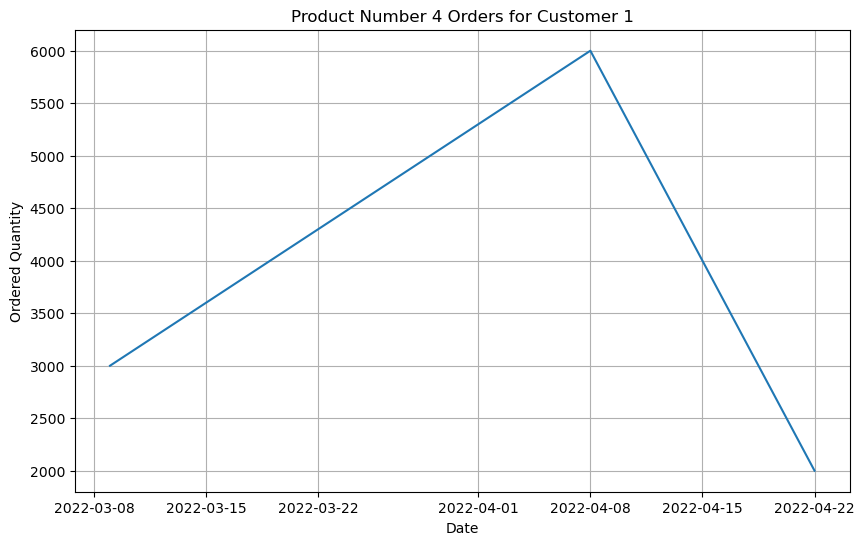

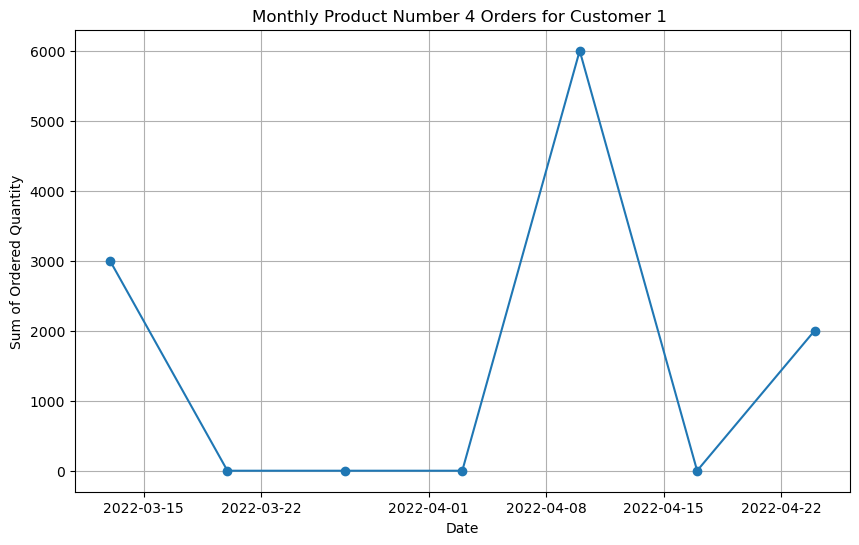

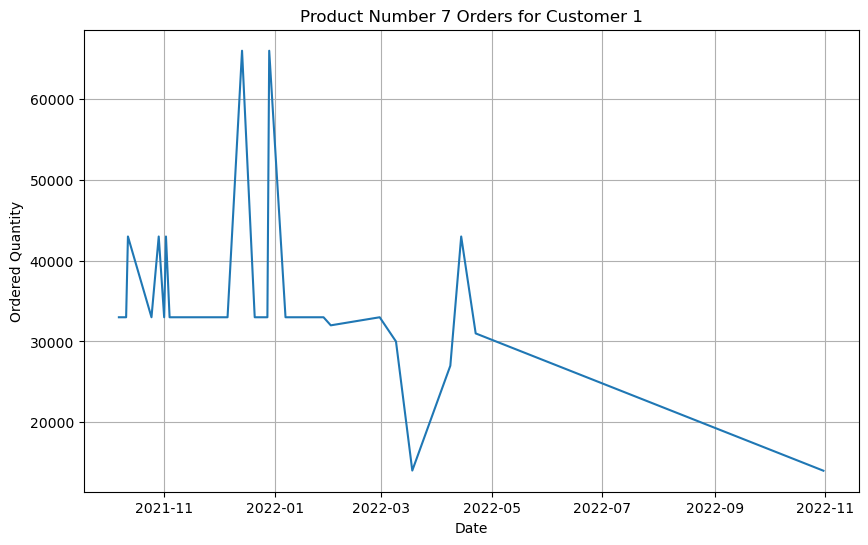

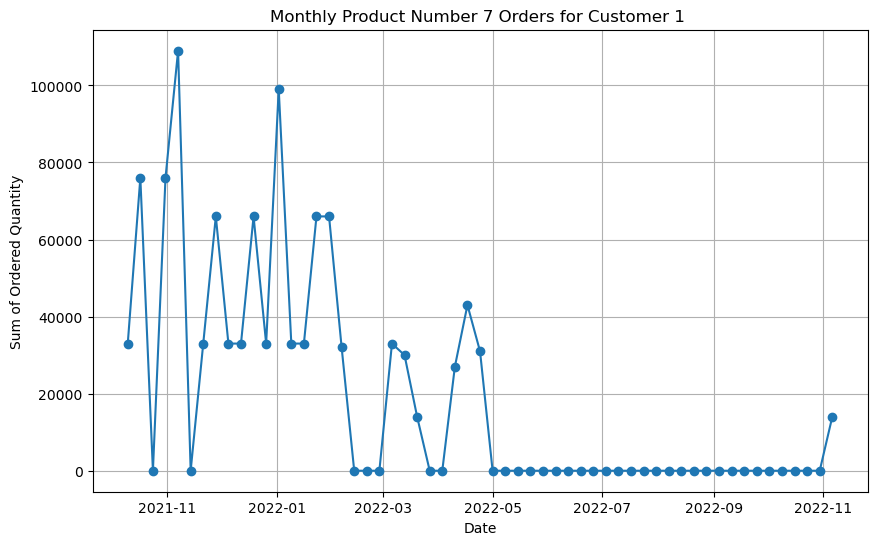

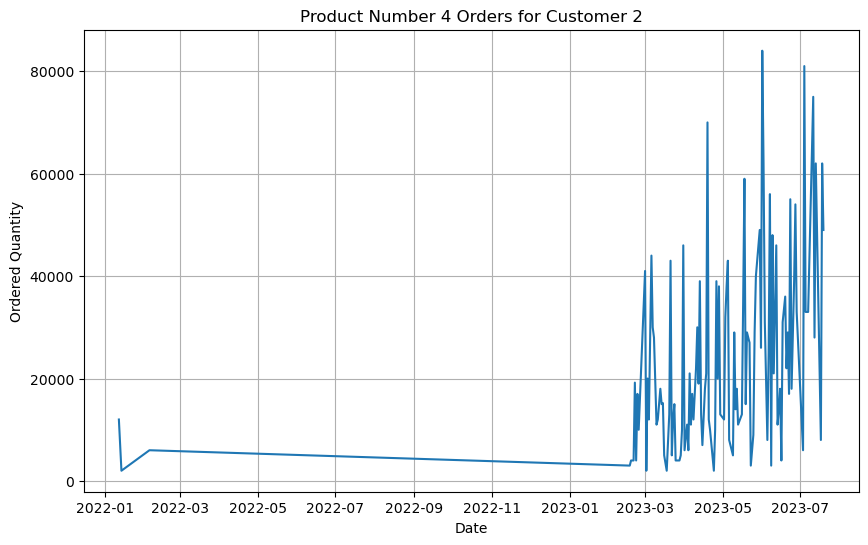

...

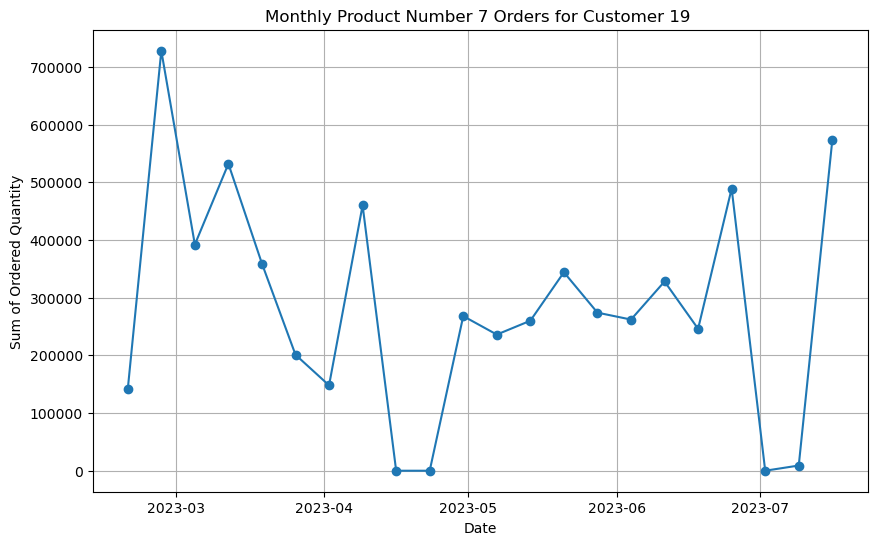

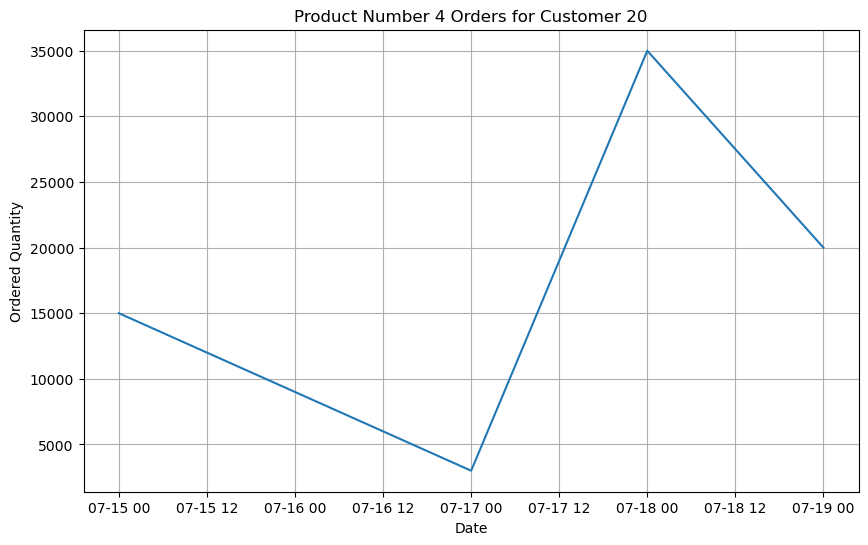

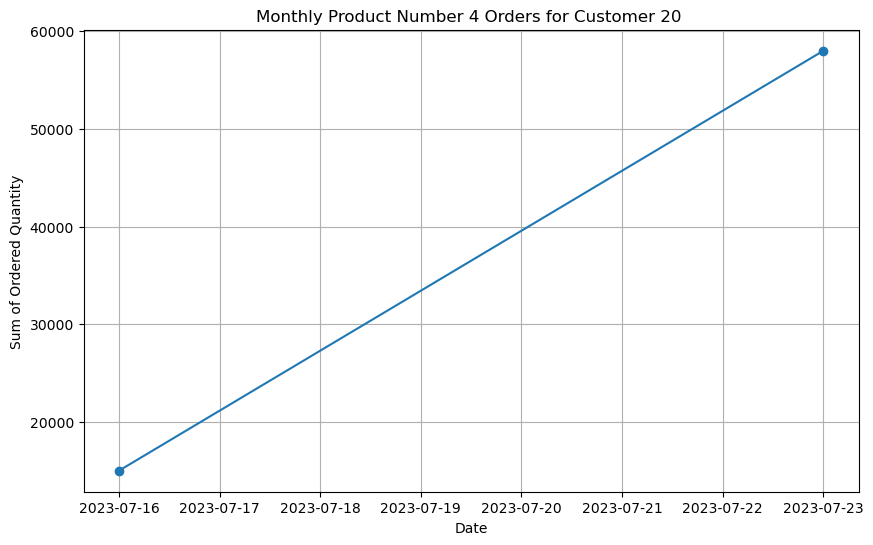

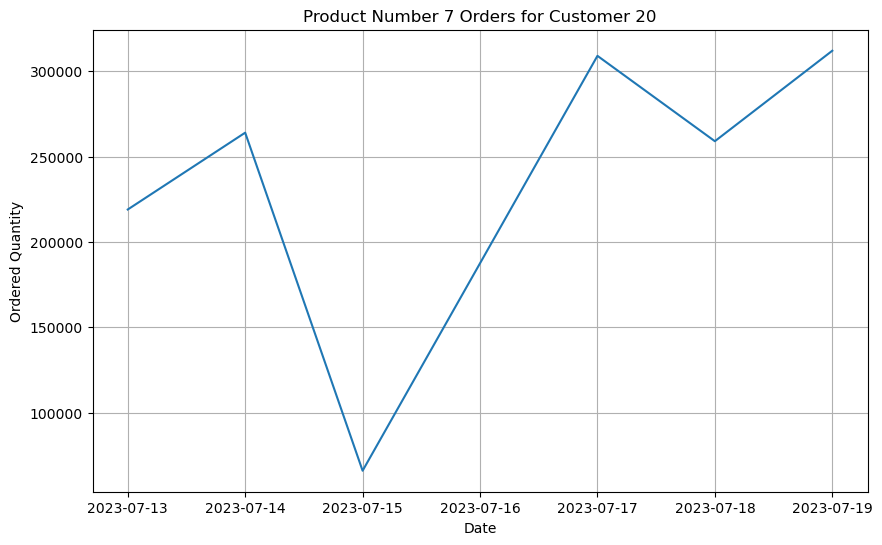

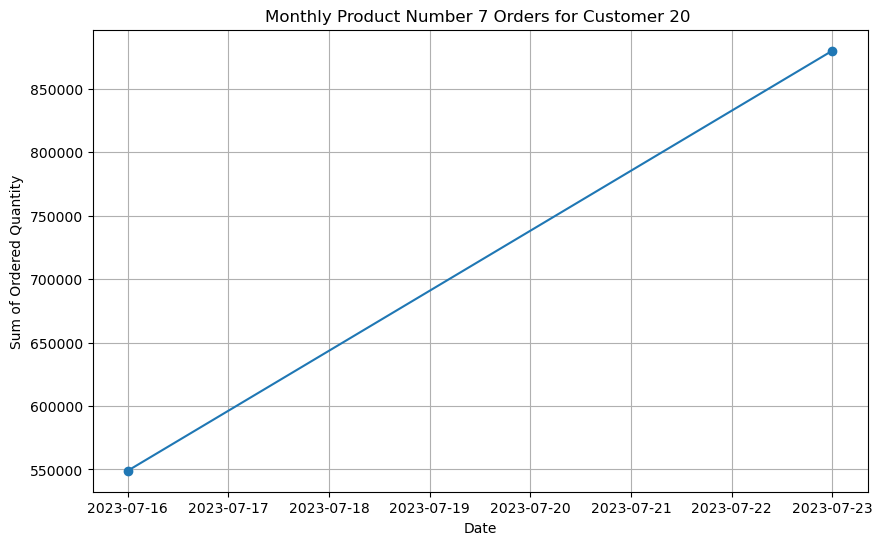

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

# Iterate over unique customer numbers
for customer_number in unique_customers:
    # Iterate over unique terminal product numbers for the current customer
    for product_number in unique_terminal_product_numbers:
        # Extract xts data for the current customer and product number
        xts_series = xts_data[f"xts_data_customer_{customer_number}_product_number_{product_number}"]
        
        # Plot the time series data
        plt.figure(figsize=(10, 6))
        plt.plot(xts_series)
        plt.title(f'Product Number {product_number} Orders for Customer {customer_number}')
        plt.xlabel('Date')
        plt.ylabel('Ordered Quantity')
        plt.grid(True)
        plt.show()
        
        # Resample the data to monthly frequency and plot
        product_data_monthly = xts_series.resample('W').sum()
        plt.figure(figsize=(10, 6))
        plt.plot(product_data_monthly, marker='o')
        plt.title(f'Monthly Product Number {product_number} Orders for Customer {customer_number} ')
        plt.xlabel('Date')
        plt.ylabel('Sum of Ordered Quantity')
        plt.grid(True)
        plt.show()

In [5]:
# example
print(data_customer_7_product_number_4)

      FOLIO_NUMBER  ORDERED_QUANTITY
5       2021-09-27              6000
53      2021-09-29             33000
79      2021-09-30             42000
103     2021-10-01             40000
149     2021-10-04             33000
...            ...               ...
13227   2023-07-12             18000
13252   2023-07-13             33000
13318   2023-07-16             18000
13330   2023-07-17             18000
13355   2023-07-18             33000

[405 rows x 2 columns]


In [6]:
# example
print(xts_data['xts_data_customer_3_product_number_4'])

FOLIO_NUMBER
2021-09-27     83100
2021-09-28    216100
2021-09-29    251400
2021-09-30    258200
2021-10-01    286300
               ...  
2023-07-15    219000
2023-07-16     59000
2023-07-17    276000
2023-07-18    422000
2023-07-19    262000
Length: 654, dtype: int64


Root Mean Squared Error (RMSE) for Customer 1, Product 4: 1414.213562373095


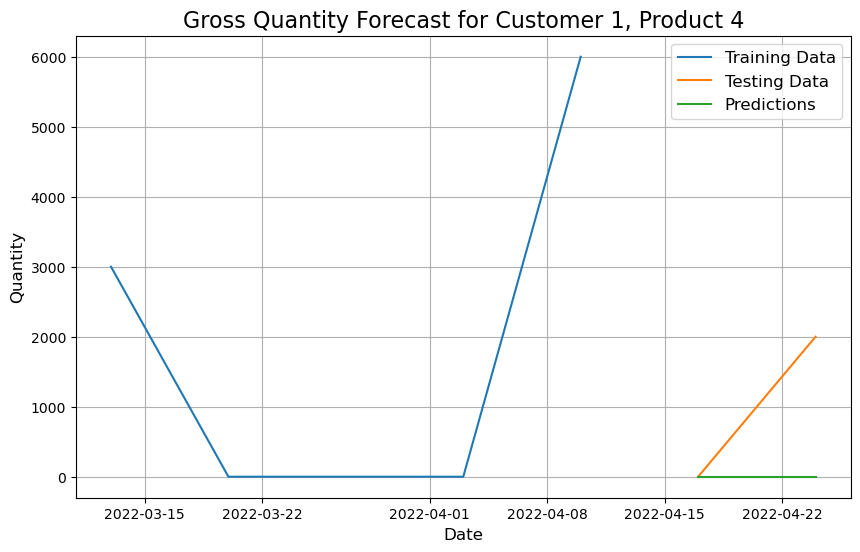

Root Mean Squared Error (RMSE) for Customer 1, Product 7: 2869.719513007035


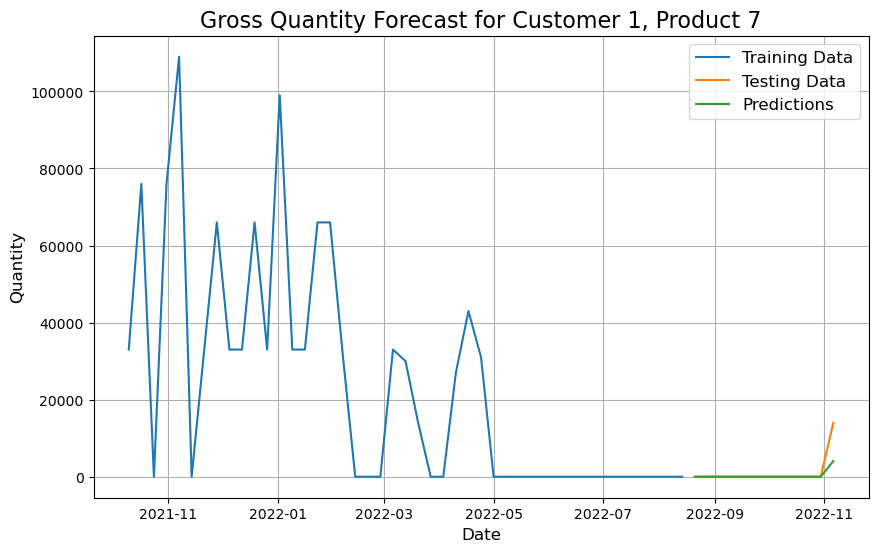

Root Mean Squared Error (RMSE) for Customer 2, Product 4: 8972.20356503908


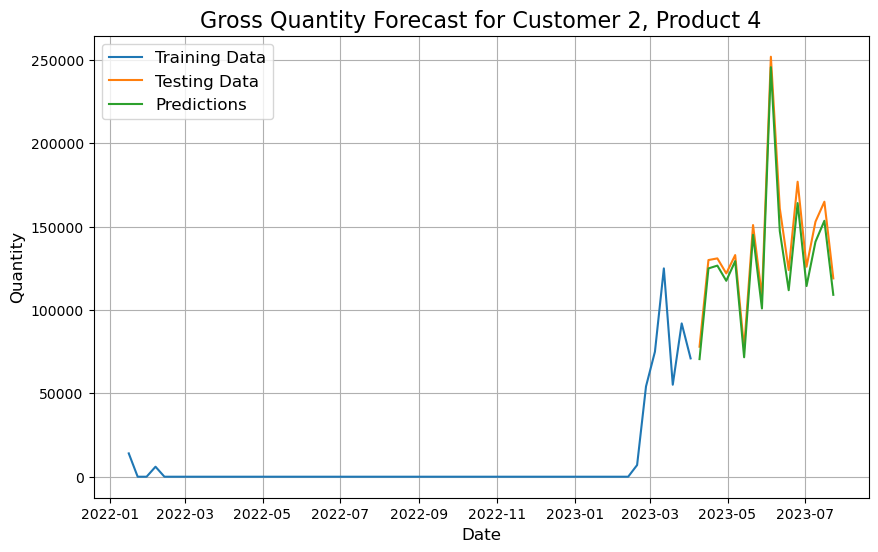

Root Mean Squared Error (RMSE) for Customer 2, Product 7: 290617.60581227497


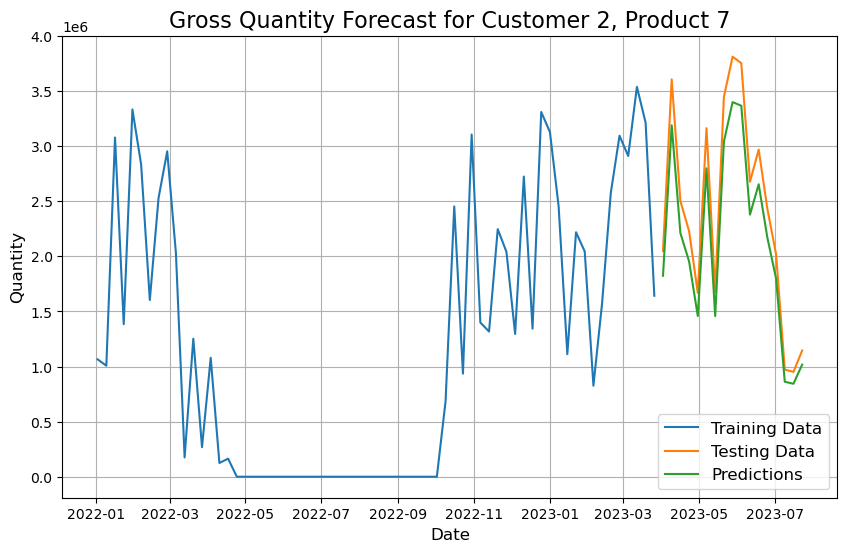

Root Mean Squared Error (RMSE) for Customer 3, Product 4: 78305.80701932244


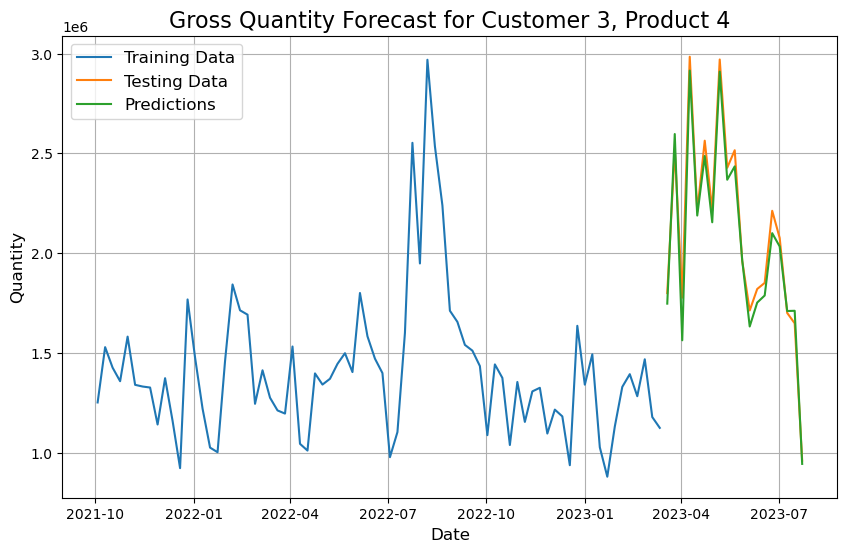

Root Mean Squared Error (RMSE) for Customer 3, Product 7: 445223.8437293738


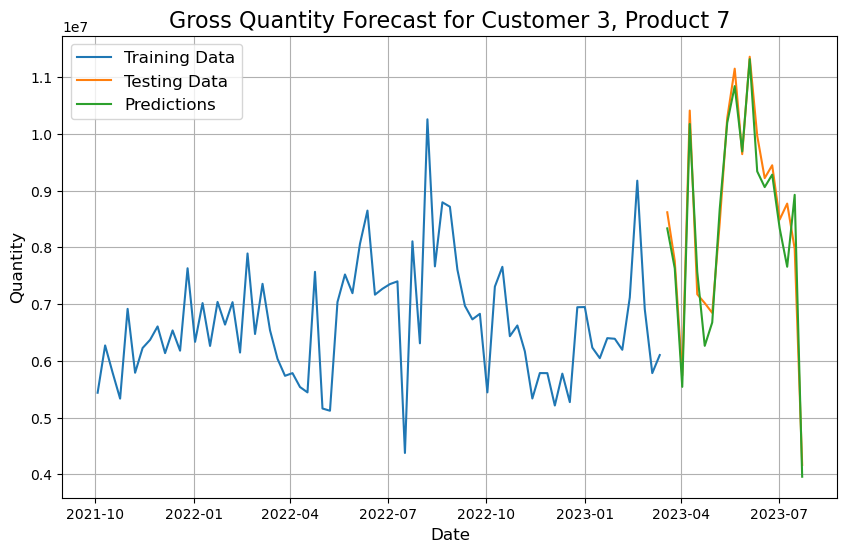

Root Mean Squared Error (RMSE) for Customer 5, Product 4: 22747.25336340516


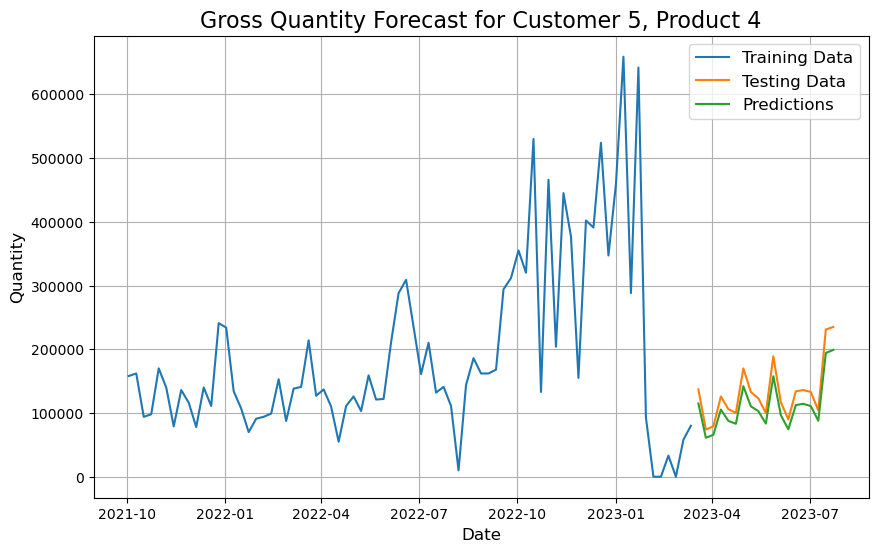

Root Mean Squared Error (RMSE) for Customer 5, Product 7: 155149.76590633154


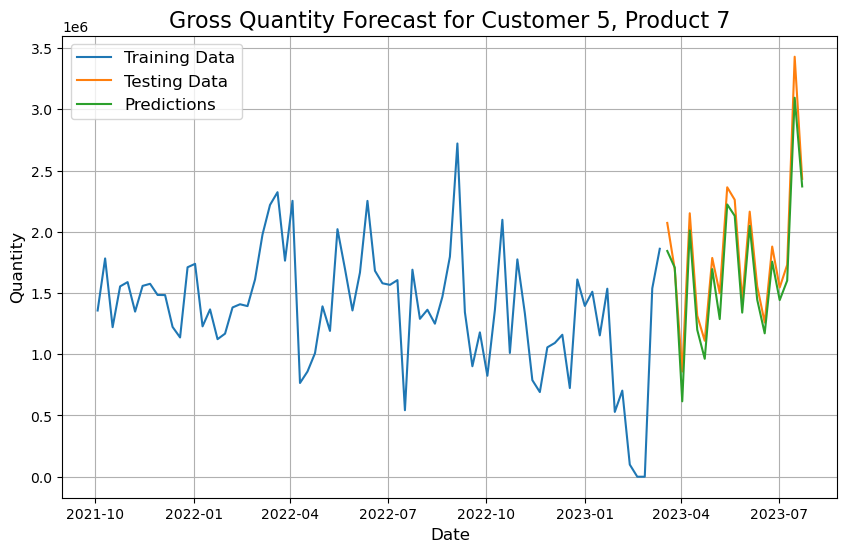

Root Mean Squared Error (RMSE) for Customer 6, Product 4: 38883.07321530368


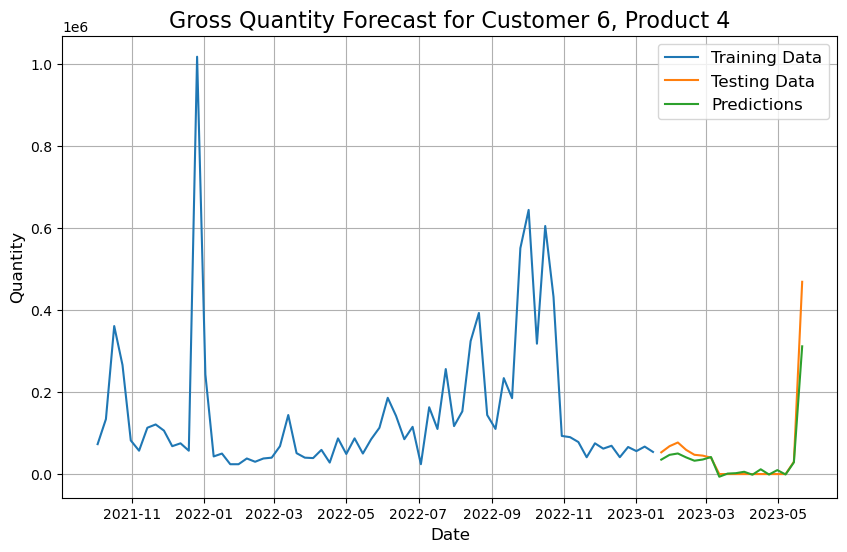

Root Mean Squared Error (RMSE) for Customer 6, Product 7: 25230.221915173257


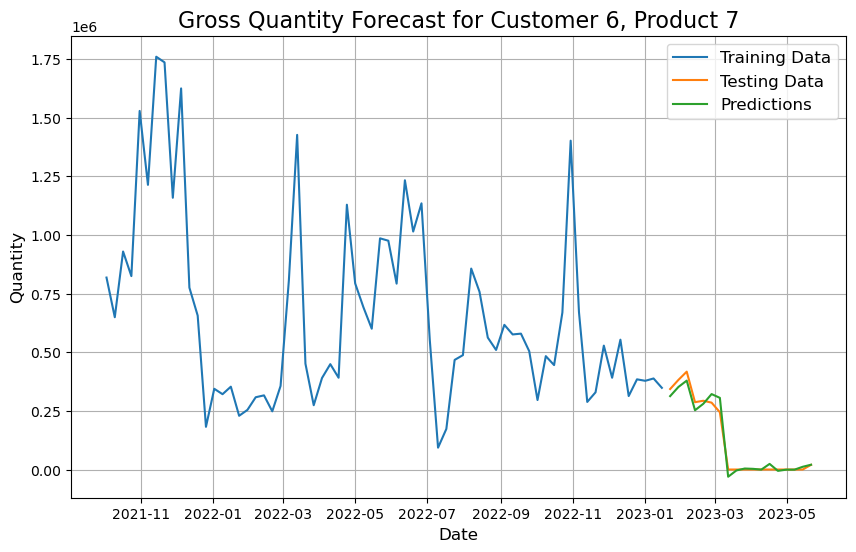

Root Mean Squared Error (RMSE) for Customer 7, Product 4: 27244.49205851186


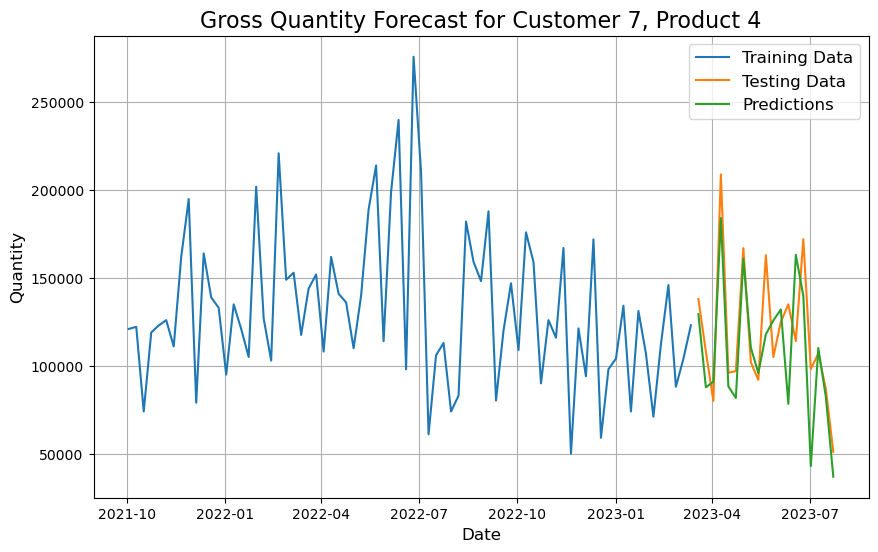

Root Mean Squared Error (RMSE) for Customer 7, Product 7: 100039.84827478552


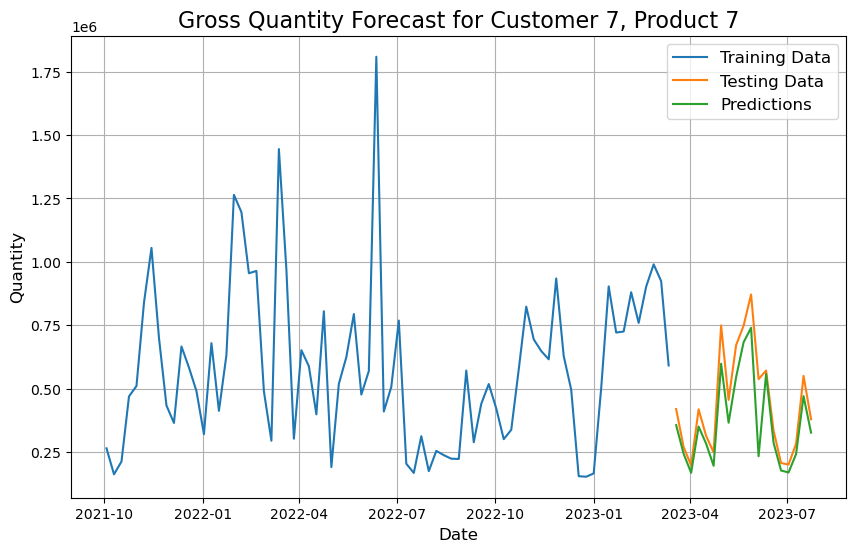

Root Mean Squared Error (RMSE) for Customer 8, Product 4: 48952.545768970565


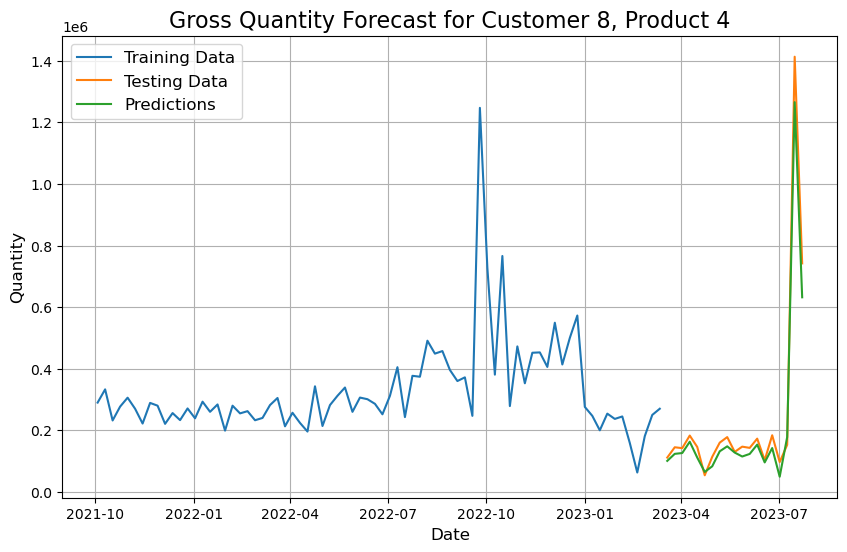

Root Mean Squared Error (RMSE) for Customer 8, Product 7: 230297.01092902204


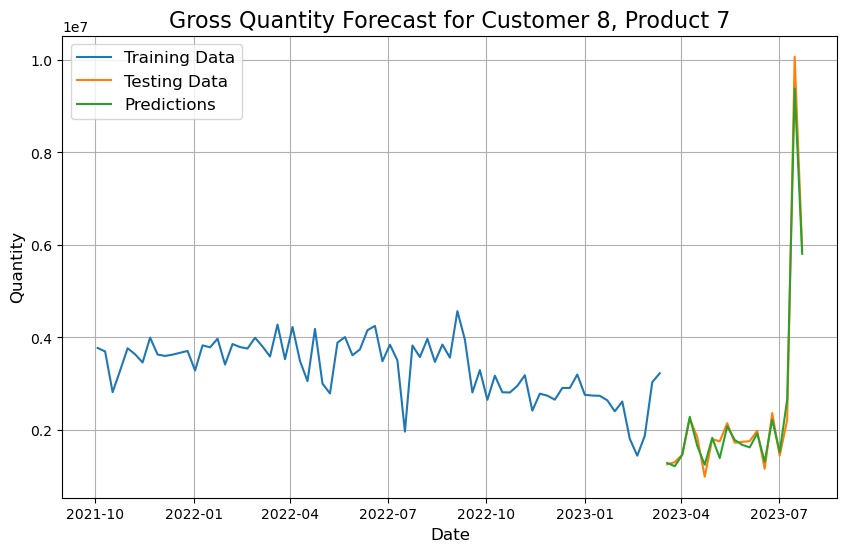

Root Mean Squared Error (RMSE) for Customer 9, Product 4: 35482.5807456056


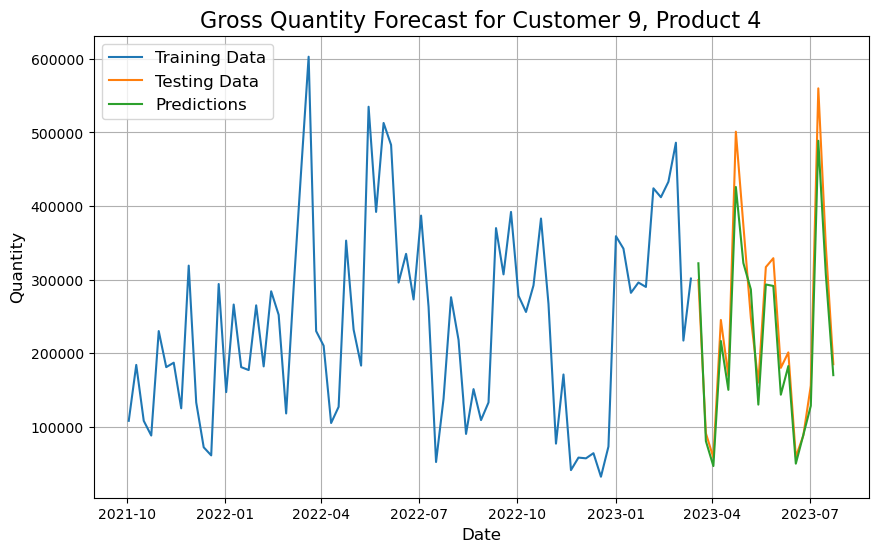

Root Mean Squared Error (RMSE) for Customer 9, Product 7: 174902.26579781785


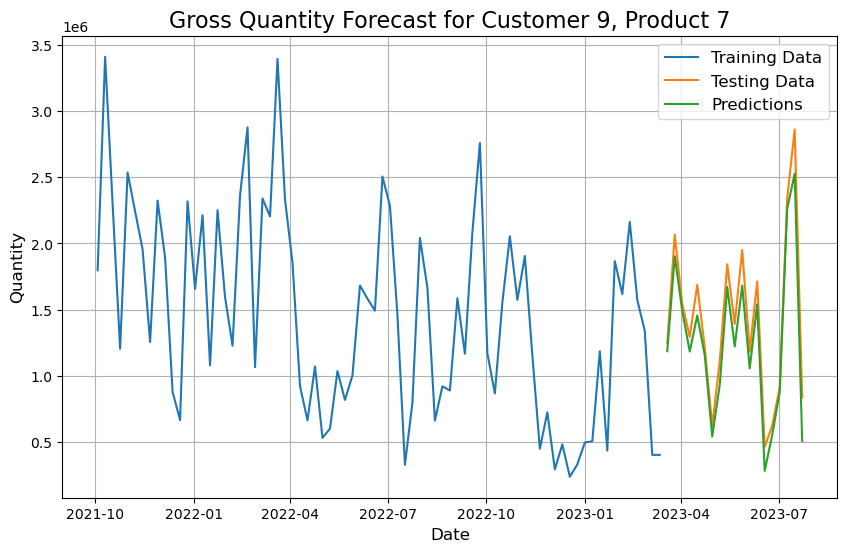

Root Mean Squared Error (RMSE) for Customer 12, Product 4: 43476.49626734209


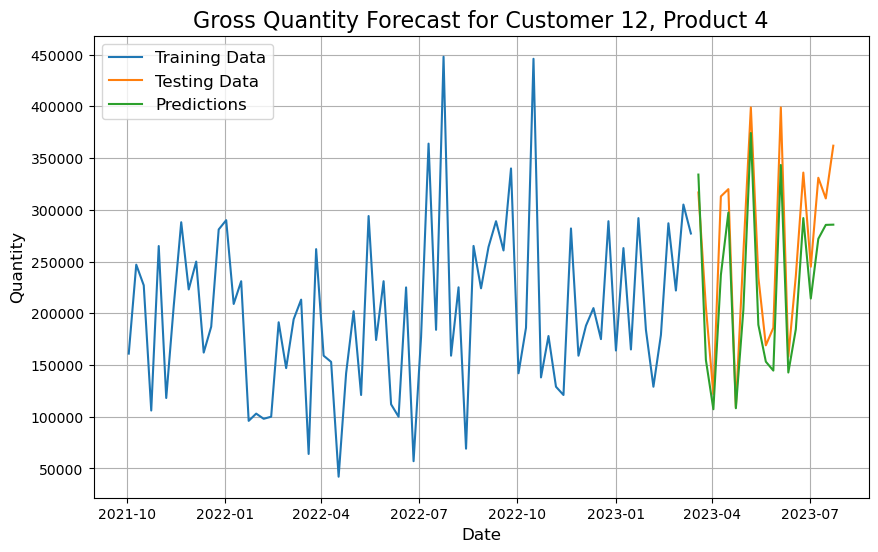

Root Mean Squared Error (RMSE) for Customer 12, Product 7: 214686.1886634585


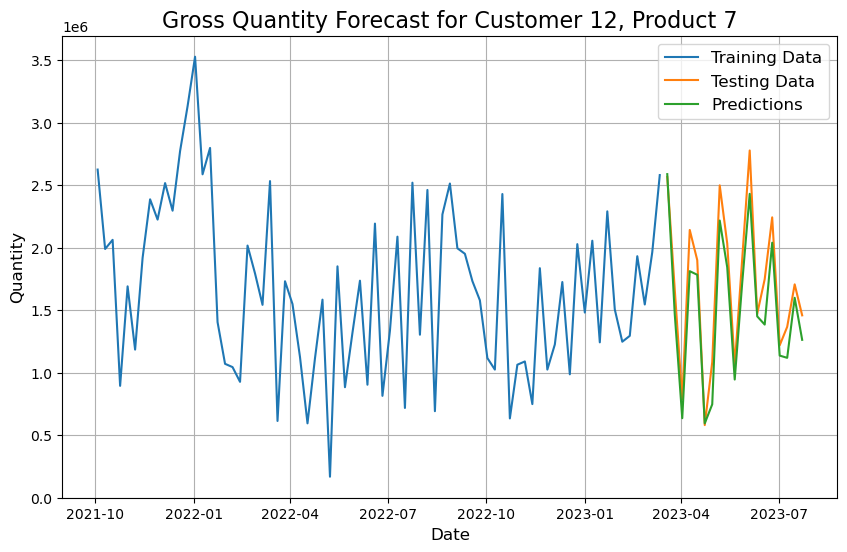

Root Mean Squared Error (RMSE) for Customer 13, Product 4: 42465.69134738196


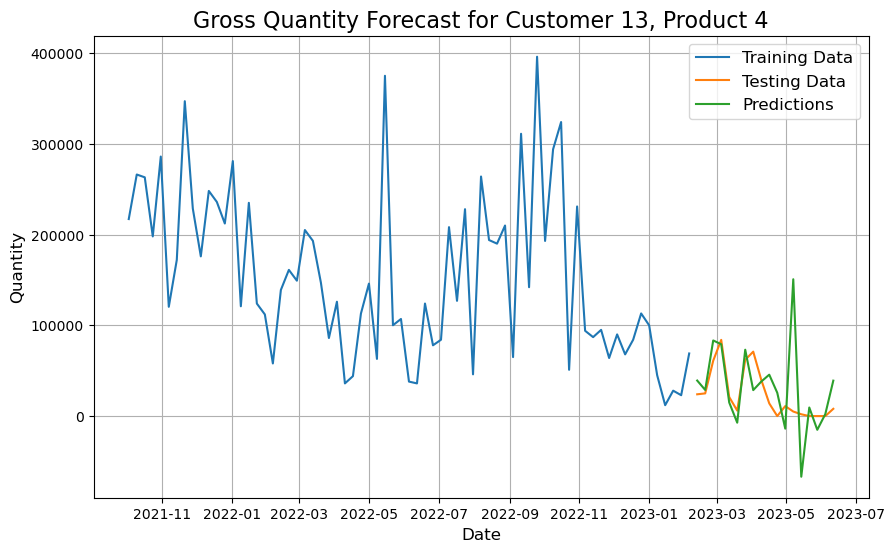

Root Mean Squared Error (RMSE) for Customer 13, Product 7: 313230.8633130556


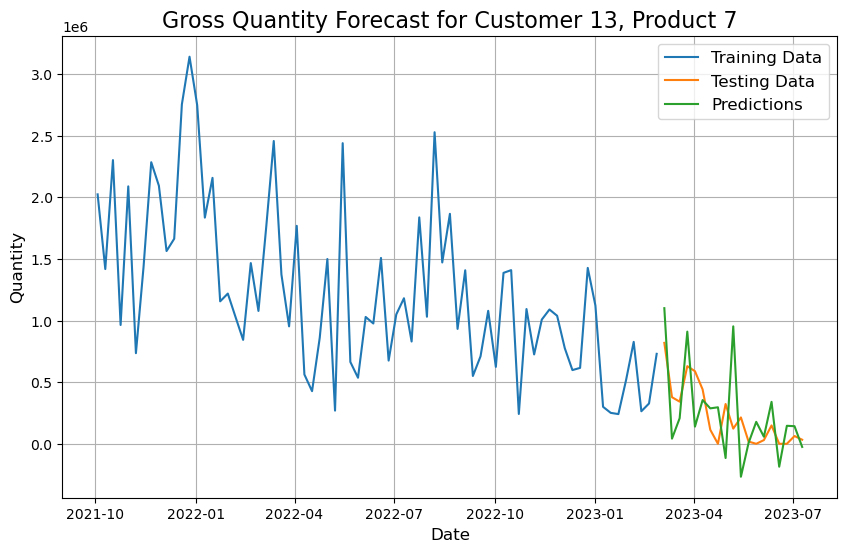

Root Mean Squared Error (RMSE) for Customer 14, Product 4: 25820.033129131993


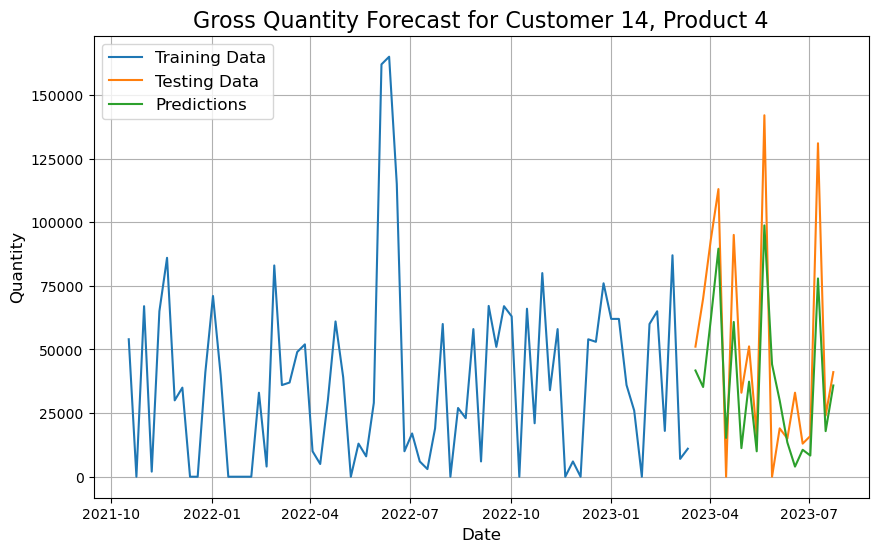

Root Mean Squared Error (RMSE) for Customer 14, Product 7: 180851.4524703398


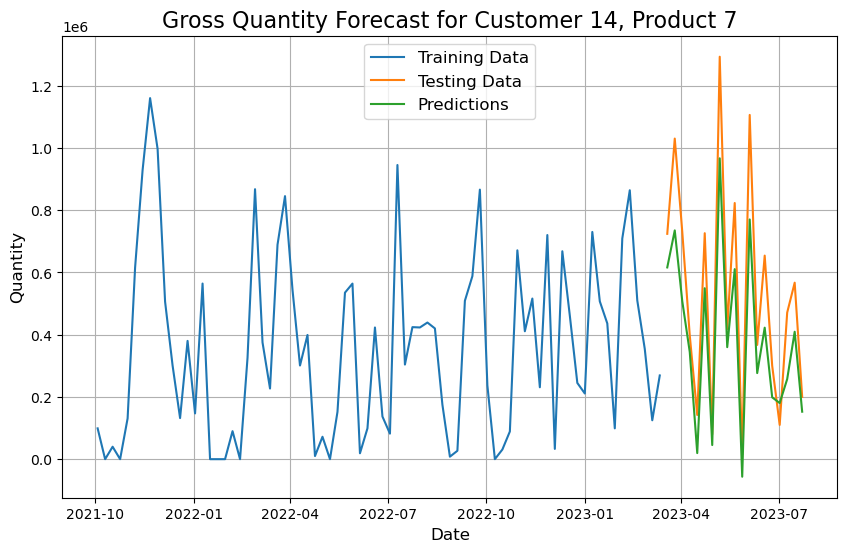

Root Mean Squared Error (RMSE) for Customer 15, Product 4: 15168.448621363603


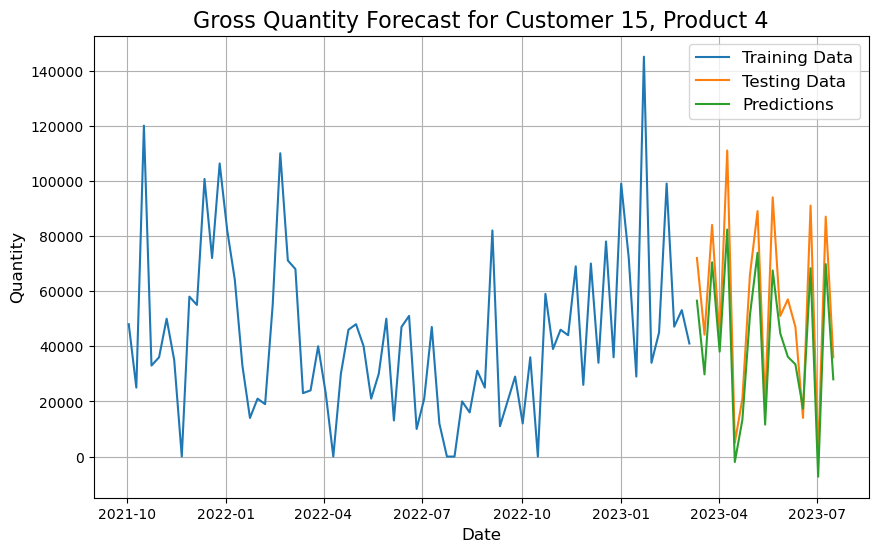

Root Mean Squared Error (RMSE) for Customer 15, Product 7: 106020.0084353495


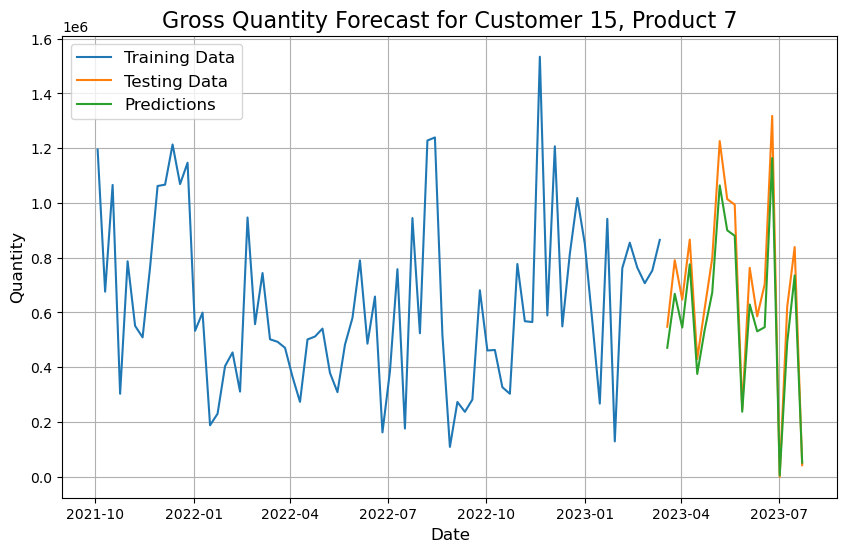

Root Mean Squared Error (RMSE) for Customer 16, Product 4: 7829.79629364647


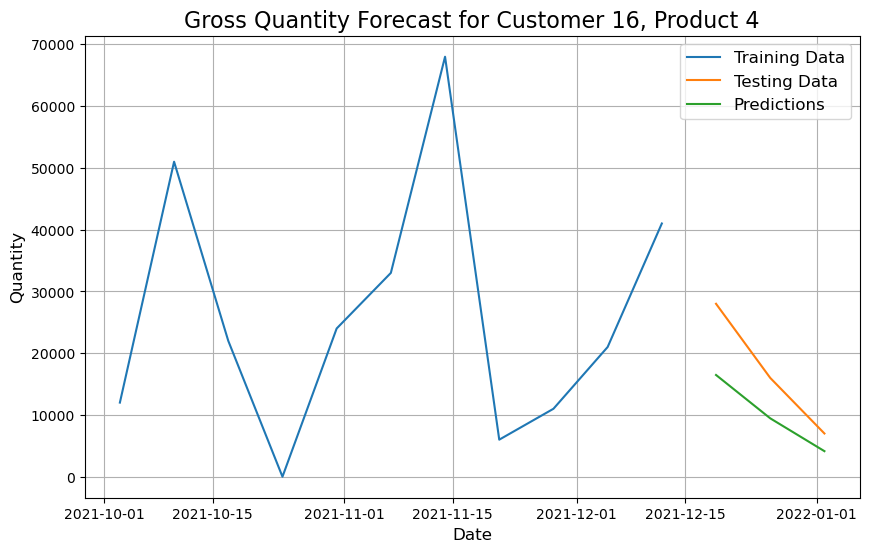

Root Mean Squared Error (RMSE) for Customer 16, Product 7: 33931.3187077956


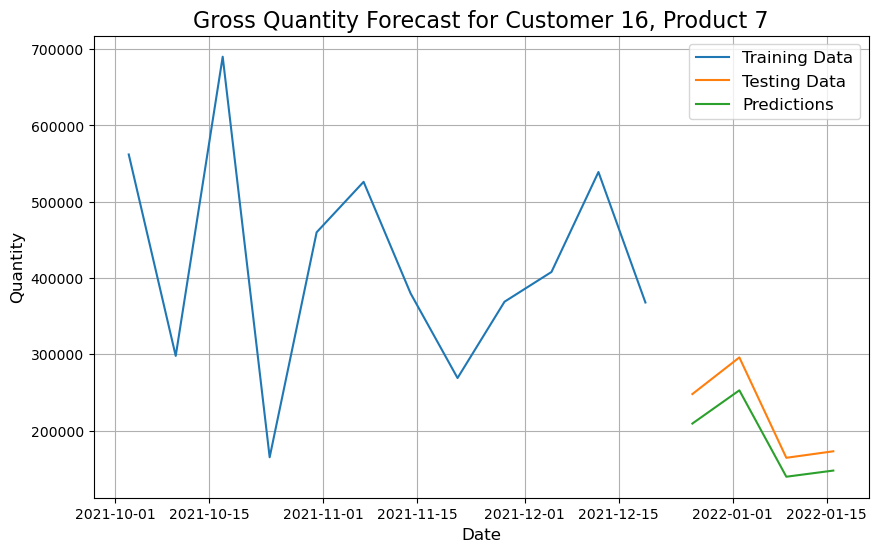

Root Mean Squared Error (RMSE) for Customer 17, Product 4: 16557.206581358398


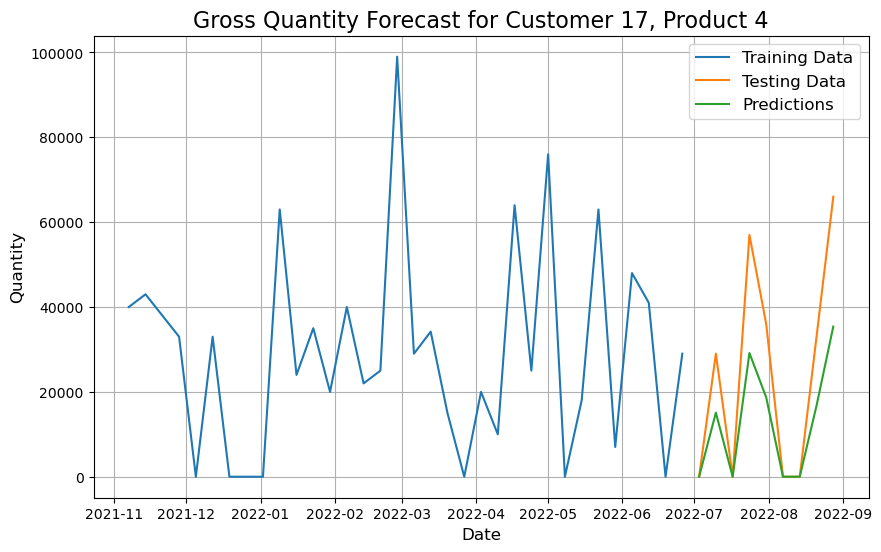

Root Mean Squared Error (RMSE) for Customer 17, Product 7: 41353.63986700566


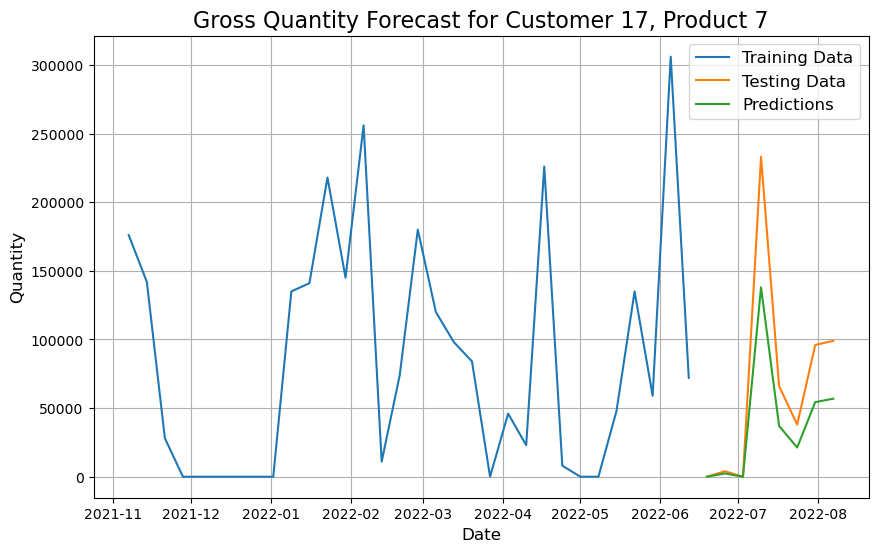

Root Mean Squared Error (RMSE) for Customer 18, Product 4: 2474.0


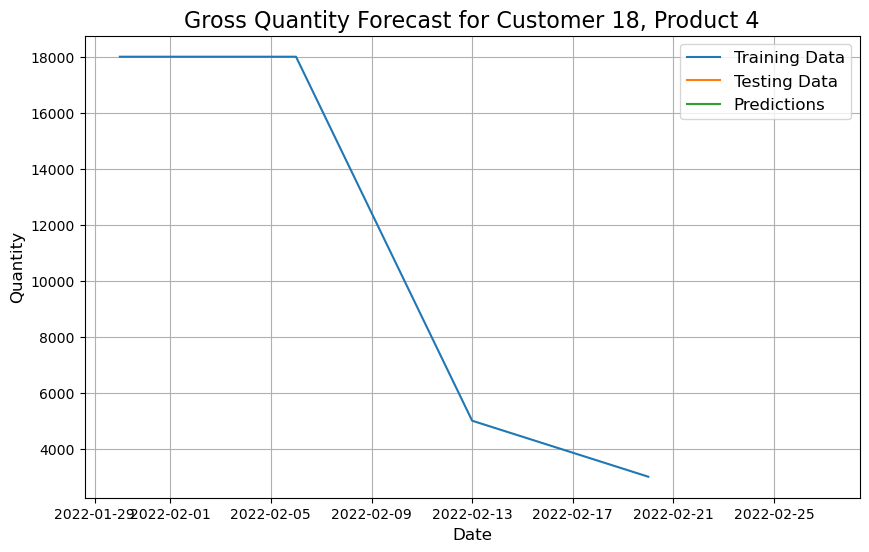

Root Mean Squared Error (RMSE) for Customer 18, Product 7: 30107.577922066954


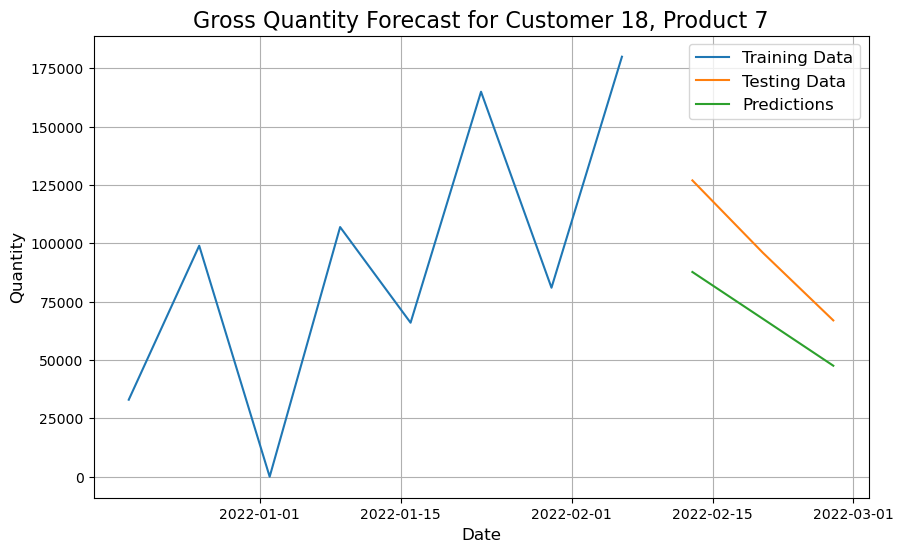

Root Mean Squared Error (RMSE) for Customer 19, Product 4: 21629.643593919896


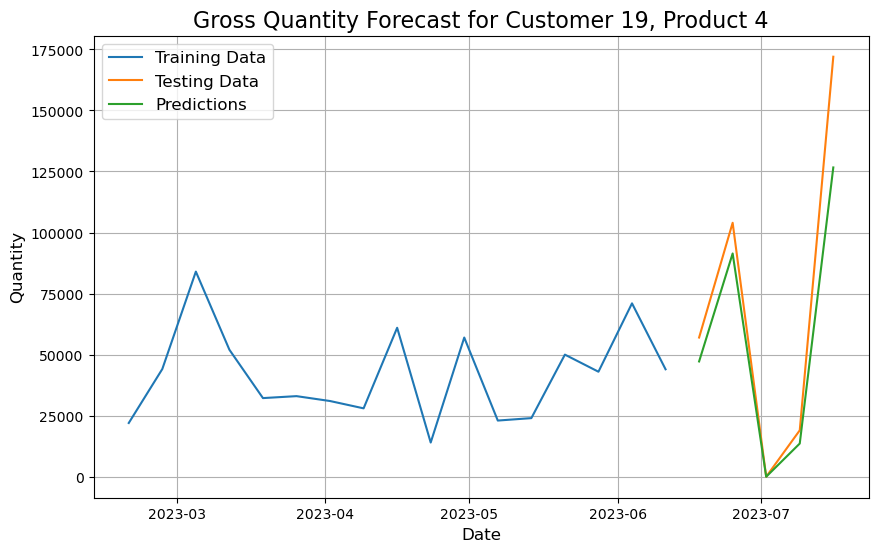

Root Mean Squared Error (RMSE) for Customer 19, Product 7: 98655.21768867575


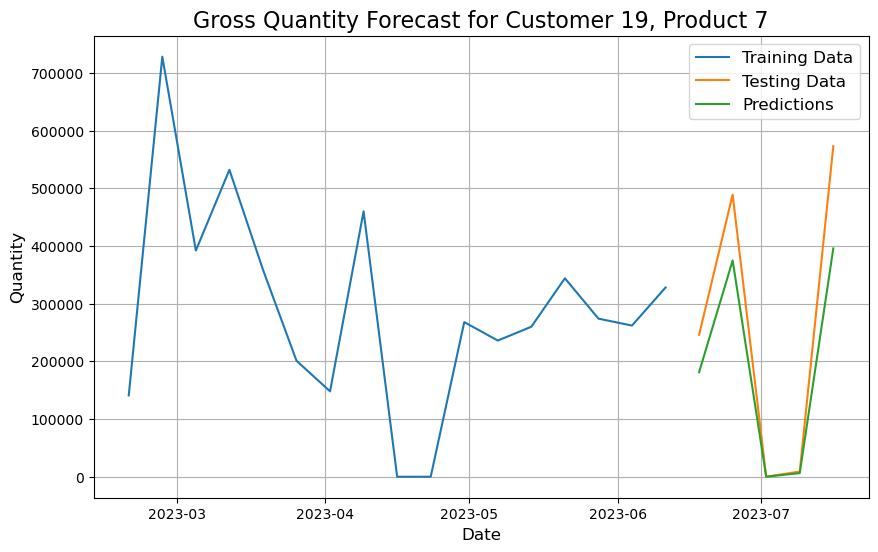

Root Mean Squared Error (RMSE) for Customer 20, Product 4: 29880.0


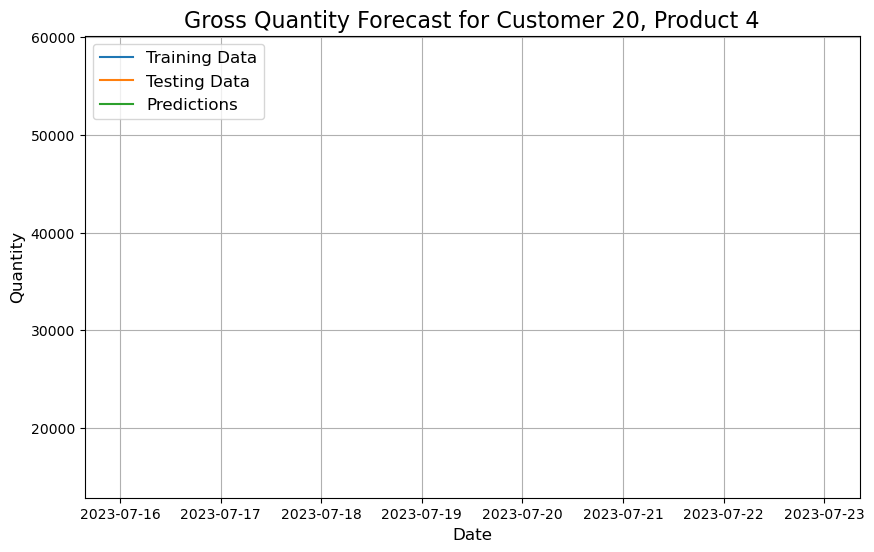

Root Mean Squared Error (RMSE) for Customer 20, Product 7: 89801.0


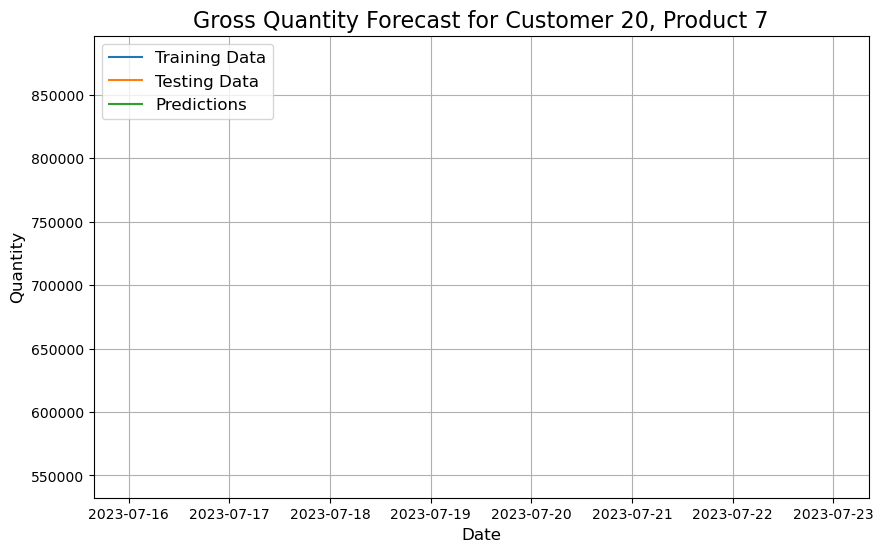

In [24]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Define a function to perform SARIMA forecasting
def perform_forecast(train_data):
    try:
        model = SARIMAX(train_data, order=(1, 0, 0), seasonal_order=(1, 0,0, 52))
        model_fit = model.fit()
        pred = model_fit.forecast(steps=1).astype(int)  # Forecast one step ahead
        return pred[0]  # Return the forecasted value
    except Exception as e:
        # Handle specific exceptions
        print("Error occurred:", str(e))
        return None

# Iterate over unique customer numbers
for customer_number in unique_customers:
    # Iterate over unique terminal product numbers for the current customer
    for product_number in unique_terminal_product_numbers:
        # Extract xts data for the current customer and product number
        xts_series = xts_data[f"xts_data_customer_{customer_number}_product_number_{product_number}"]
        
        # Resample the data to weekly frequency
        product_data_weekly = xts_series.resample('W').sum()
        
        # Split data into train and test sets
        train, test = train_test_split(product_data_weekly, test_size=0.2, shuffle=False)
        
        # Perform SARIMA forecasting
        rolling_predictions = test.copy()
        for end_date in test.index:
            train_data = product_data_weekly[:end_date]  # Include end_date in training data
            forecasted_value = perform_forecast(train_data)
            if forecasted_value is not None:
                rolling_predictions.loc[end_date] = forecasted_value  # Assign forecasted value to correct index
        
        # Calculate RMSE
        rmse = np.sqrt(mean_squared_error(test, rolling_predictions))
        print(f"Root Mean Squared Error (RMSE) for Customer {customer_number}, Product {product_number}: {rmse}")
        
        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(train, label='Training Data')
        plt.plot(test, label='Testing Data')
        plt.plot(rolling_predictions, label='Predictions')
        plt.legend(fontsize=12)
        plt.title(f'Gross Quantity Forecast for Customer {customer_number}, Product {product_number}', fontsize=16)
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Quantity', fontsize=12)
        plt.grid(True)
        plt.show()


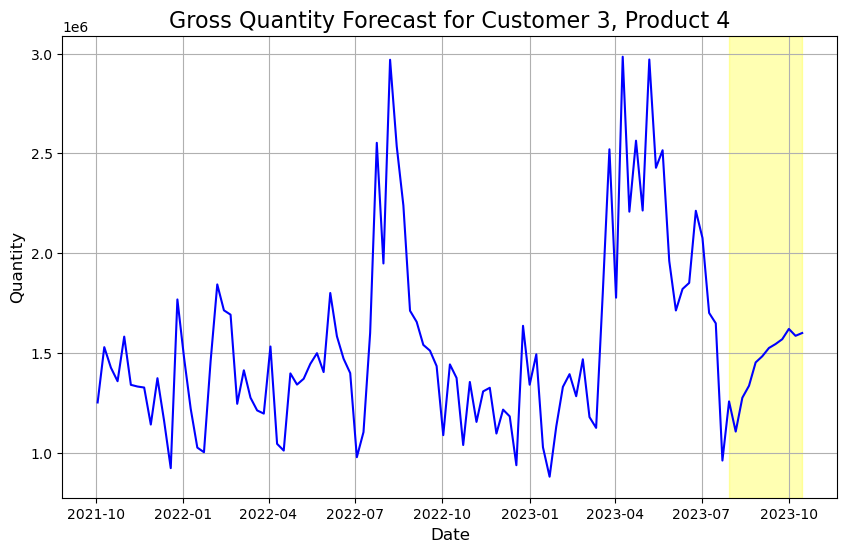

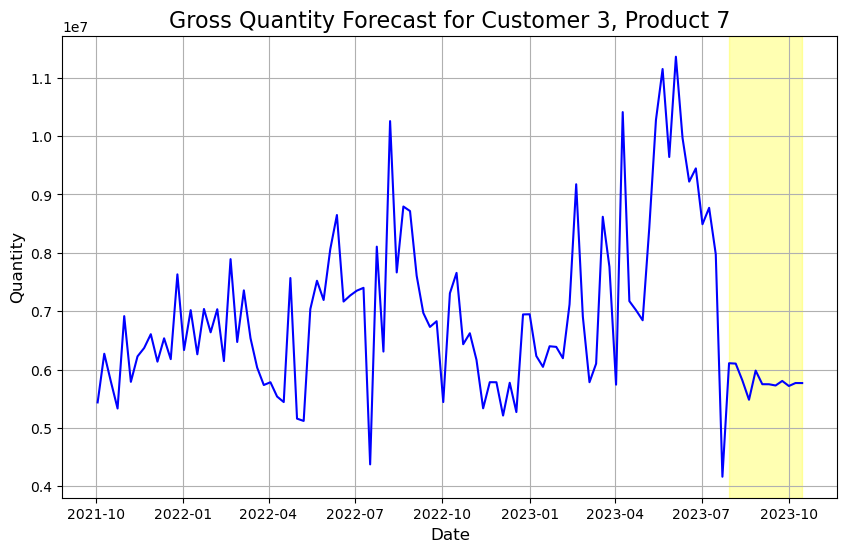

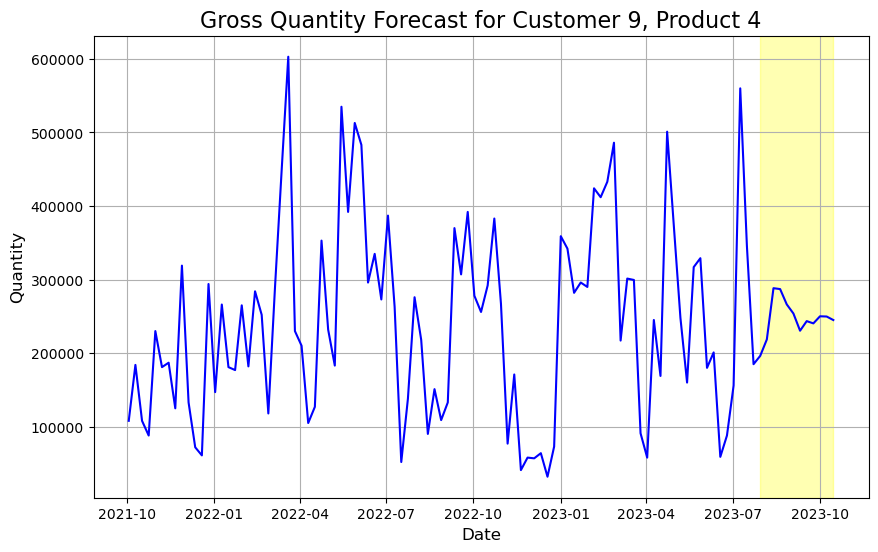

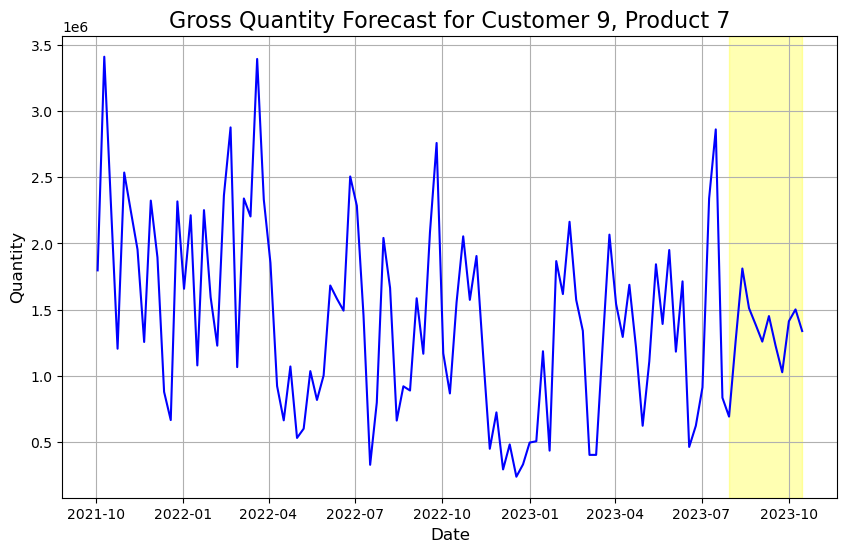

In [54]:
import pandas as pd
from datetime import datetime
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt

# Iterate over unique customer numbers
for customer_number in unique_customers:
    # Iterate over unique terminal product numbers for the current customer
    for product_number in unique_terminal_product_numbers:
        if customer_number == 3 or customer_number == 9 :
            # Extract xts data for the current customer and product number
            xts_series = xts_data[f"xts_data_customer_{customer_number}_product_number_{product_number}"]

            # Resample the data to weekly frequency
            product_data_weekly = xts_series.resample('W').sum()

            # Initial training data
            train_data = product_data_weekly

            # Create a DataFrame with the next dates
            next_dates = pd.date_range(start=product_data_weekly.index[-1]+ pd.Timedelta(days=7), periods=12, freq='W')  # Example: forecast next 12 weeks
            next_dates_df = pd.DataFrame(next_dates, columns=['Date'])
            next_dates_df.set_index('Date', inplace=True)  # Set Date column as index

            # Initialize an empty dataframe to store predictions
            future_predictions = pd.DataFrame(index=next_dates_df.index, columns=['Forecast'])

            # Fitting the model and making predictions for each future date
            for end_date in next_dates_df.index:
                try:
                    model = SARIMAX(train_data, order=(4,1,1), seasonal_order=(1,0,0,52))  # SARIMA with seasonal component
                    model_fit = model.fit()
                    pred = model_fit.forecast(steps=1)  # Forecast one step ahead
                    future_predictions.loc[end_date] = pred[0]  # Assign forecasted value to correct index
                    train_data = train_data._append(pd.Series(pred[0], index=[end_date]))  # Append predicted value to training data
                except Exception as e:
                    print("Error occurred for date:", end_date)
                    print("Error details:", str(e))

            
            plt.figure(figsize=(10, 6))
            plt.plot(train_data, color='blue', label='Historical Data')
            plt.axvspan(next_dates[0], next_dates[-1], color='yellow', alpha=0.3, label='Future Period')
            plt.title(f'Gross Quantity Forecast for Customer {customer_number}, Product {product_number}', fontsize=16)
            plt.xlabel('Date', fontsize=12)
            plt.ylabel('Quantity', fontsize=12)
            plt.grid(True)
            plt.show()


# Customer 3 product number 4

In [54]:
product_data_monthly = xts_data['xts_data_customer_9_product_number_7'].resample('M').sum()

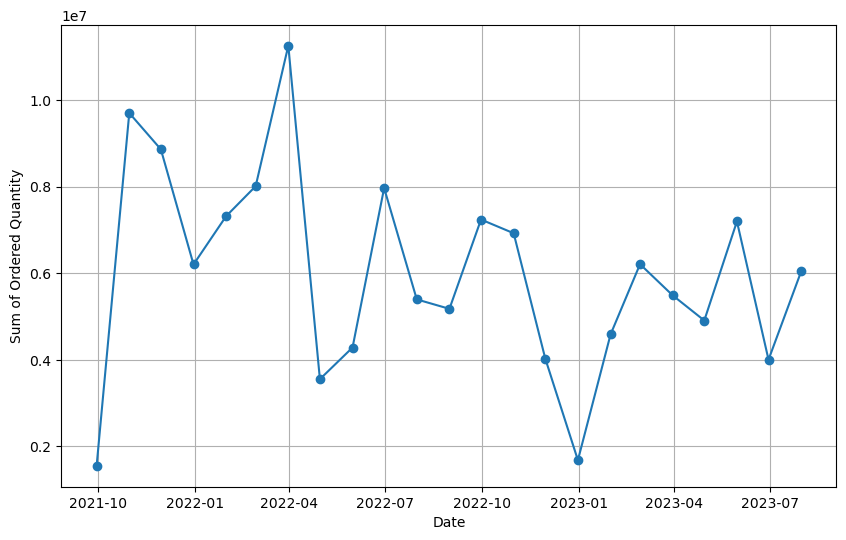

In [55]:
plt.figure(figsize=(10, 6))
plt.plot(product_data_monthly, marker='o')
plt.xlabel('Date')
plt.ylabel('Sum of Ordered Quantity')
plt.grid(True)
plt.show()

In [56]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity(time_series):
    adf_result = adfuller(time_series)
    adf_p_value = adf_result[1]
    if adf_p_value <= 0.05:
        adf_msg = "ADF test: The series is stationary."
    else:
        adf_msg = "ADF test: The series is non-stationary."
    return f"{adf_msg}\n"

In [57]:
# Check stationarity
result_message = check_stationarity(product_data_monthly)
print(result_message)

ADF test: The series is non-stationary.



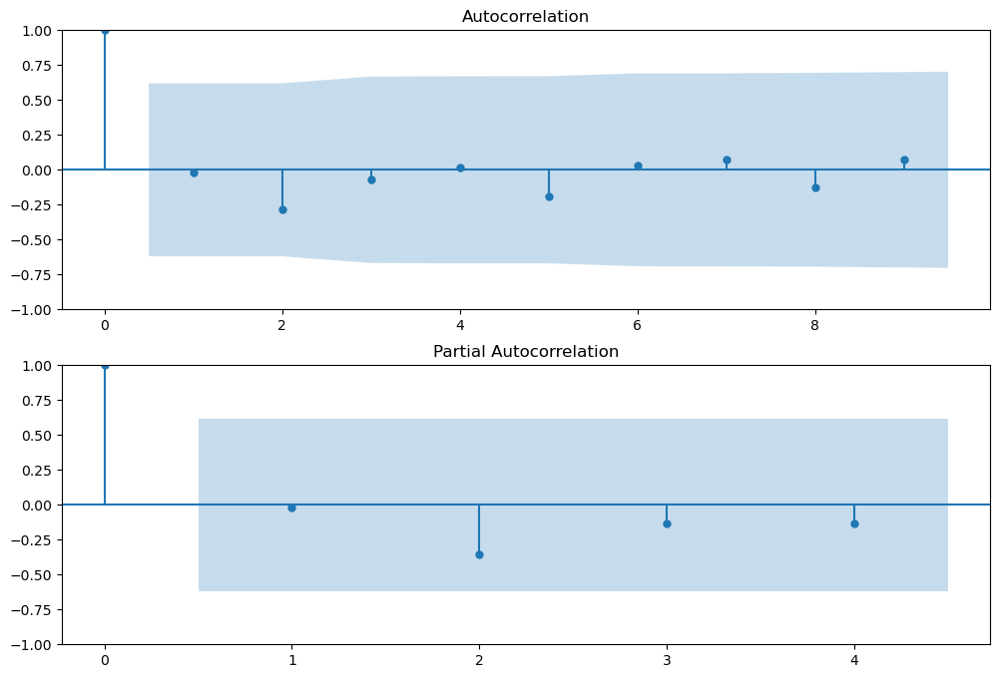

In [58]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
plot_acf(product_data_monthly.iloc[13:], lags=9, ax=ax1)
ax2 = fig.add_subplot(212)
plot_pacf(product_data_monthly.iloc[13:], lags=4, ax=ax2)
plt.show()

Root Mean Squared Error (RMSE) on test data: 5021621.235499109


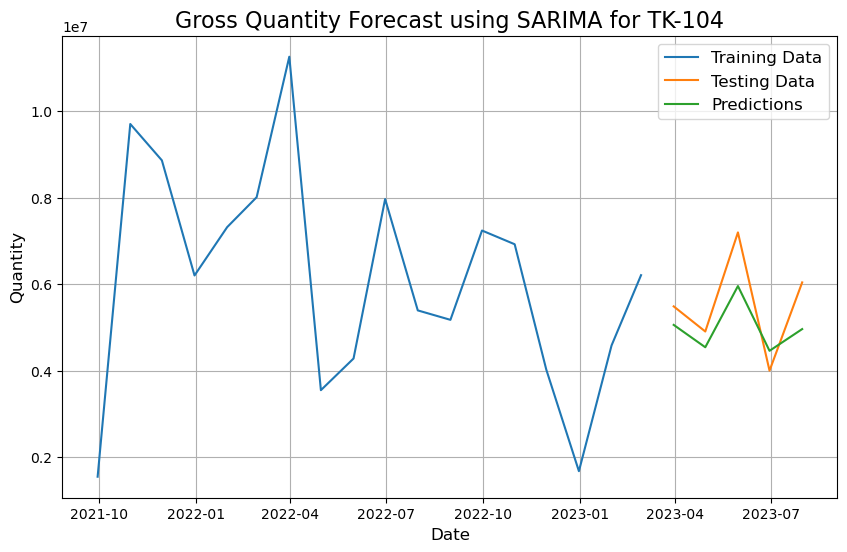

In [63]:
train, test = train_test_split(product_data_monthly, test_size=0.2, shuffle=False)

rolling_predictions = test.copy()
for end_date in test.index:
    train_data = product_data_monthly[:end_date]  # Include end_date in training data
    try:
        model = SARIMAX(train_data, order=(2,0,0), seasonal_order=(1,0,0,26))
        model_fit = model.fit()
        pred = model_fit.forecast(steps=1).astype(int)  # Forecast one step ahead
        rolling_predictions.loc[end_date] = pred[0]  # Assign forecasted value to correct index
    except Exception as e:
        # Handle specific exceptions
        print("Error occurred for date:", end_date)
        print("Error details:", str(e))

rolling_residuals = test - rolling_predictions

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test, rolling_residuals))
print("Root Mean Squared Error (RMSE) on test data:", rmse)

# Plotting
plt.figure(figsize=(10, 6))

plt.plot(train, label='Training Data')
plt.plot(test, label='Testing Data')
plt.plot(rolling_predictions, label='Predictions')

plt.legend(fontsize=12)
plt.title('Gross Quantity Forecast using SARIMA for TK-104', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Quantity', fontsize=12)
plt.grid(True)
plt.show()

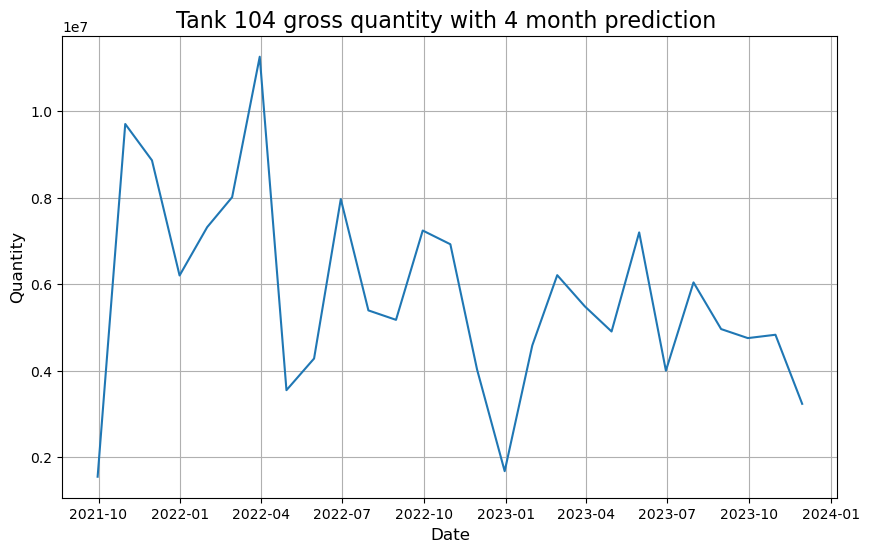

In [64]:
# Extract the last date (index)
last_date_index = product_data_monthly.index[-1]

# Convert the last date to a datetime object
last_date_dt = pd.to_datetime(last_date_index)

# Generate 8 dates with a 2-week step starting from the day after the last date
next_dates = pd.date_range(start=last_date_dt + pd.DateOffset(days=30), periods=4, freq='M')

# Convert the next_dates to a datetime index
next_dates = pd.to_datetime(next_dates)

# Create a Series with future dates as the index
future_series = pd.Series(index=next_dates)

# Initialize an empty dataframe to store predictions
future_predictions = pd.DataFrame(index=future_series.index, columns=['Forecast'])

# Initial training data
train_data = product_data_monthly

# Fitting the model and making predictions for each future date
for end_date in future_series.index:
    try:
        model = SARIMAX(train_data, order=(2,0,0), seasonal_order=(1,0,0,26))  # SARIMA with seasonal component
        model_fit = model.fit()
        pred = model_fit.forecast(steps=1)  # Forecast one step ahead
        future_predictions.loc[end_date] = pred[0]  # Assign forecasted value to correct index
        train_data = train_data._append(pd.Series(pred[0], index=[end_date]))
    except Exception as e:
        print("Error occurred for date:", end_date)
        print("Error details:", str(e))

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(train_data)
plt.title('Tank 104 gross quantity with 4 month prediction ', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Quantity', fontsize=12)
plt.grid(True)
plt.show()

# Customer 7 product number 4

In [44]:
product_data_monthly = xts_data['xts_data_customer_7_product_number_4'].resample('M').sum()

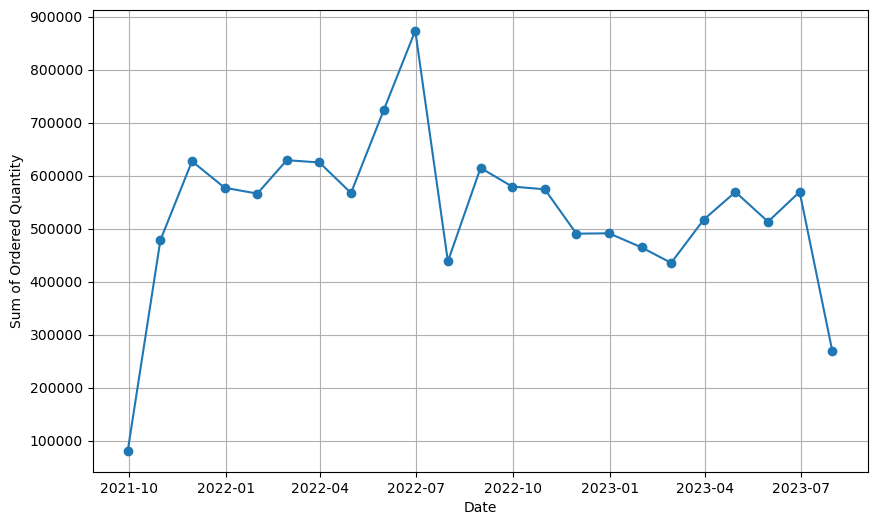

In [45]:
plt.figure(figsize=(10, 6))
plt.plot(product_data_monthly, marker='o')
plt.xlabel('Date')
plt.ylabel('Sum of Ordered Quantity')
plt.grid(True)
plt.show()

In [46]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity(time_series):
    adf_result = adfuller(time_series)
    adf_p_value = adf_result[1]
    if adf_p_value <= 0.05:
        adf_msg = "ADF test: The series is stationary."
    else:
        adf_msg = "ADF test: The series is non-stationary."
    return f"{adf_msg}\n"

In [47]:
# Check stationarity
result_message = check_stationarity(product_data_monthly)
print(result_message)

ADF test: The series is stationary.



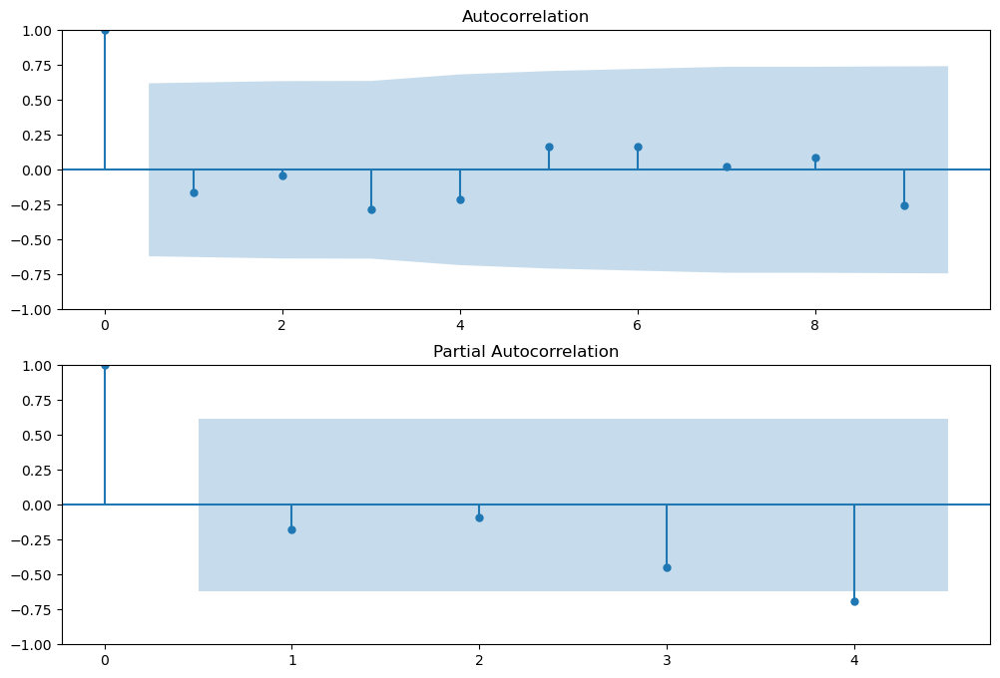

In [48]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
plot_acf(product_data_monthly.iloc[13:], lags=9, ax=ax1)
ax2 = fig.add_subplot(212)
plot_pacf(product_data_monthly.iloc[13:], lags=4, ax=ax2)
plt.show()

Root Mean Squared Error (RMSE) on test data: 487547.69233091443


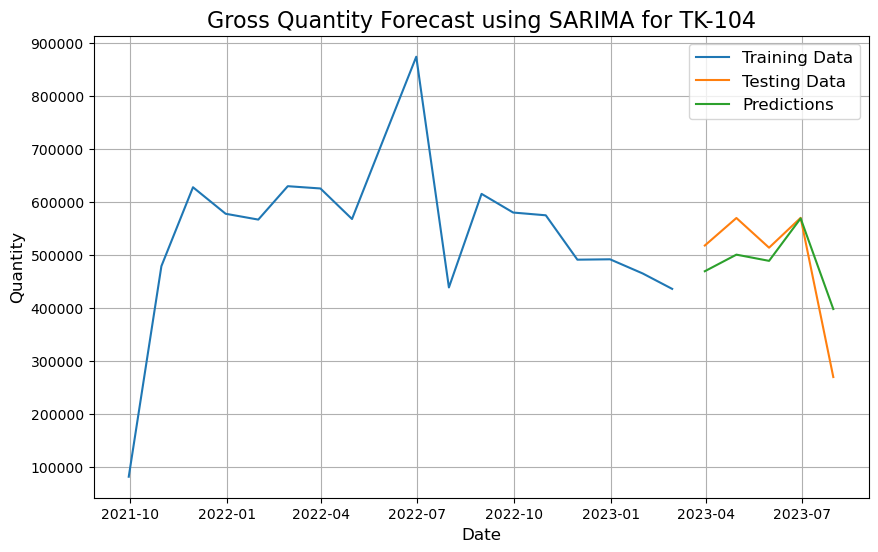

In [52]:
train, test = train_test_split(product_data_monthly, test_size=0.2, shuffle=False)

rolling_predictions = test.copy()
for end_date in test.index:
    train_data = product_data_monthly[:end_date]  # Include end_date in training data
    try:
        model = SARIMAX(train_data, order=(4,0,0), seasonal_order=(1,0,0,26))
        model_fit = model.fit()
        pred = model_fit.forecast(steps=1).astype(int)  # Forecast one step ahead
        rolling_predictions.loc[end_date] = pred[0]  # Assign forecasted value to correct index
    except Exception as e:
        # Handle specific exceptions
        print("Error occurred for date:", end_date)
        print("Error details:", str(e))

rolling_residuals = test - rolling_predictions

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test, rolling_residuals))
print("Root Mean Squared Error (RMSE) on test data:", rmse)

# Plotting
plt.figure(figsize=(10, 6))

plt.plot(train, label='Training Data')
plt.plot(test, label='Testing Data')
plt.plot(rolling_predictions, label='Predictions')

plt.legend(fontsize=12)
plt.title('Gross Quantity Forecast using SARIMA for TK-104', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Quantity', fontsize=12)
plt.grid(True)
plt.show()

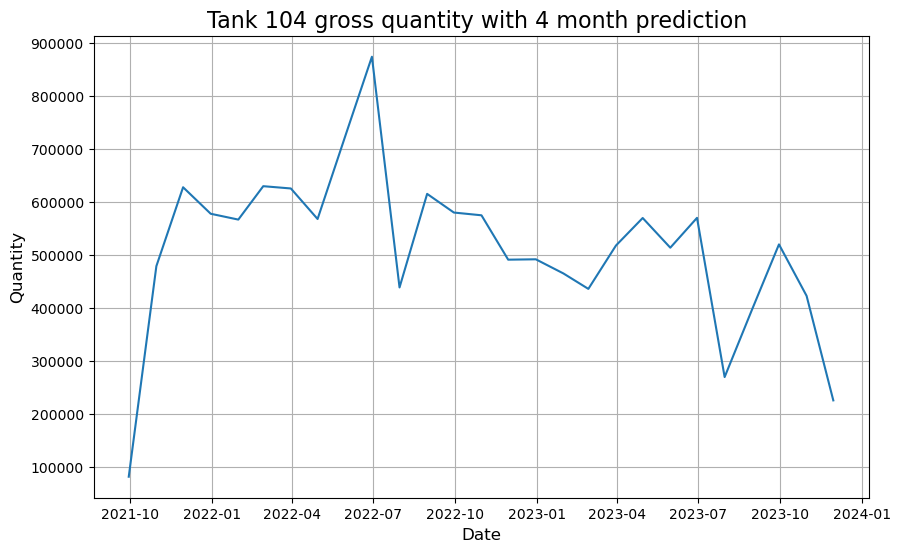

In [53]:
# Extract the last date (index)
last_date_index = product_data_monthly.index[-1]

# Convert the last date to a datetime object
last_date_dt = pd.to_datetime(last_date_index)

# Generate 8 dates with a 2-week step starting from the day after the last date
next_dates = pd.date_range(start=last_date_dt + pd.DateOffset(days=30), periods=4, freq='M')

# Convert the next_dates to a datetime index
next_dates = pd.to_datetime(next_dates)

# Create a Series with future dates as the index
future_series = pd.Series(index=next_dates)

# Initialize an empty dataframe to store predictions
future_predictions = pd.DataFrame(index=future_series.index, columns=['Forecast'])

# Initial training data
train_data = product_data_monthly

# Fitting the model and making predictions for each future date
for end_date in future_series.index:
    try:
        model = SARIMAX(train_data, order=(4,0,0), seasonal_order=(1,0,0,26))  # SARIMA with seasonal component
        model_fit = model.fit()
        pred = model_fit.forecast(steps=1)  # Forecast one step ahead
        future_predictions.loc[end_date] = pred[0]  # Assign forecasted value to correct index
        train_data = train_data._append(pd.Series(pred[0], index=[end_date]))
    except Exception as e:
        print("Error occurred for date:", end_date)
        print("Error details:", str(e))

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(train_data)
plt.title('Tank 104 gross quantity with 4 month prediction ', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Quantity', fontsize=12)
plt.grid(True)
plt.show()

In [18]:
# Assuming your DataFrame is named data_customer_3_product_number_4
data_customer_3_product_number_4['FOLIO_NUMBER'] = pd.to_datetime(data_customer_3_product_number_4['FOLIO_NUMBER'])
data_customer_3_product_number_4.set_index('FOLIO_NUMBER', inplace=True)

# Now you can resample the data
product_data_monthly = data_customer_3_product_number_4.resample('M')['ORDERED_QUANTITY'].sum()

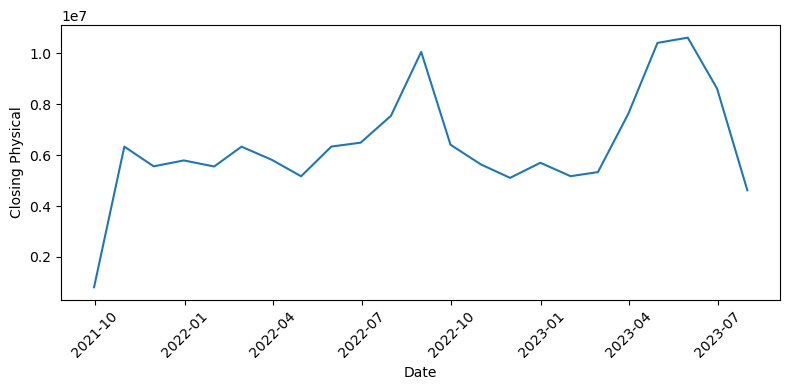

In [22]:
plt.figure(figsize=(8, 4))
plt.plot(product_data_monthly.index, product_data_monthly)
plt.xlabel('Date')
plt.ylabel('Closing Physical')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()